In [1]:
import os
from pathlib import Path

import numpy as np
import matplotlib.pyplot as plt
import tifffile
from PIL import Image
from careamics_portfolio import PortfolioManager

from careamics import CAREamist, Configuration
from careamics.config import AlgorithmModel, TrainingModel, DataModel, CheckpointModel
from careamics.config.architectures import UNetModel
from careamics.config.optimizer_models import OptimizerModel, LrSchedulerModel

from careamics.utils.metrics import psnr

In [2]:
root_path = Path(os.getcwd())

### Data

In [3]:
data_path = Path("/group/jug/Vera/w2s_sample")
noisy_path = data_path / "w2s_noisy.tiff"
gt_path = data_path / "w2s_gt.tiff"

#### Explore

In [4]:
noisy = tifffile.imread(noisy_path)
noisy.shape

(3, 3, 512, 512)

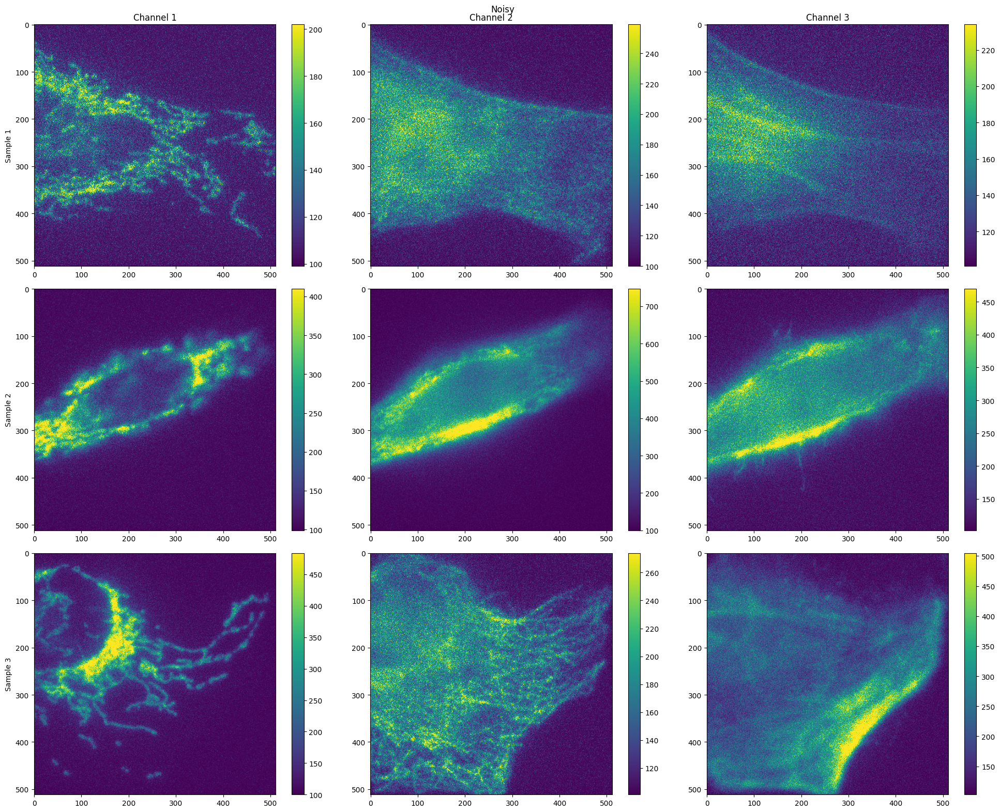

In [5]:
samples = 3
channels = 3
fig, axes = plt.subplots(samples, channels, figsize=(20, 16))
for i in range(samples):
    for j in range(channels):
        if i == 0:
            axes[j, 0].set_ylabel(f"Sample {j + 1}")
        if j == 0:
            axes[0, i].set_title(f"Channel {i + 1}")
        vmin = np.percentile(noisy[i, j], 1)
        vmax = np.percentile(noisy[i, j], 99)
        m = axes[i, j].imshow(noisy[i, j], vmin=vmin, vmax=vmax)
        plt.colorbar(m, ax=axes[i, j])
fig.suptitle("Noisy")
plt.tight_layout()


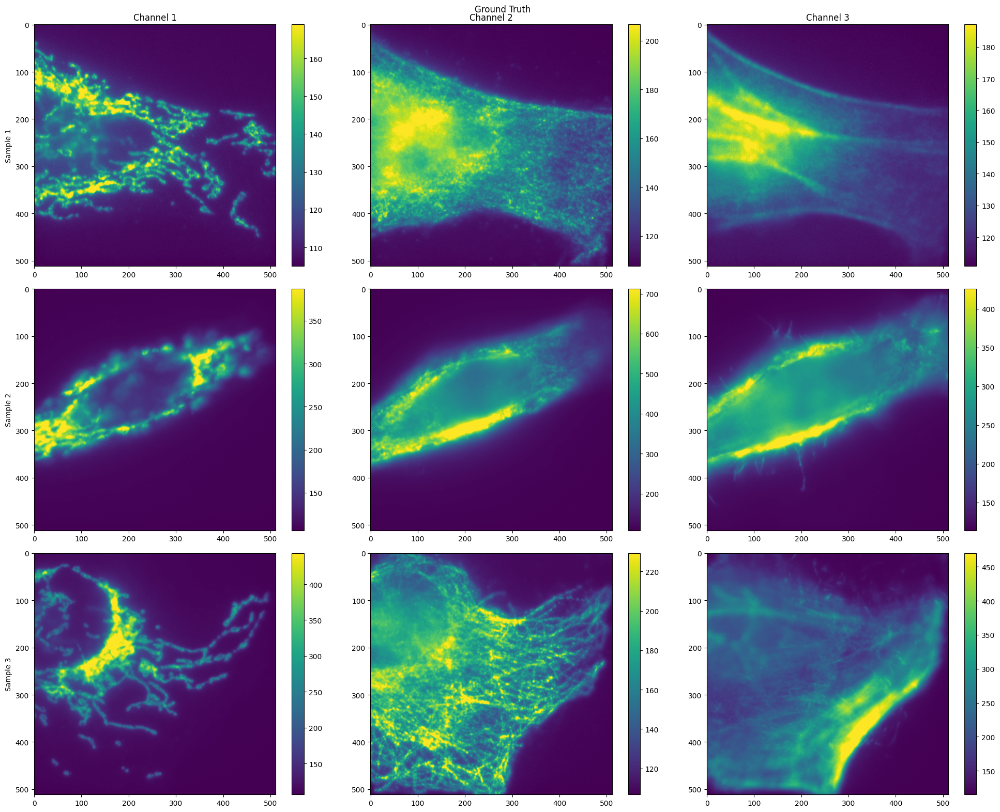

In [6]:
gt = tifffile.imread(gt_path)

fig, axes = plt.subplots(samples, channels, figsize=(20, 16))
for i in range(samples):
    for j in range(channels):
        if i == 0:
            axes[j, 0].set_ylabel(f"Sample {j + 1}")
        if j == 0:
            axes[0, i].set_title(f"Channel {i + 1}")
        vmin = np.percentile(gt[i, j], 1)
        vmax = np.percentile(gt[i, j], 99)
        m = axes[i, j].imshow(gt[i, j], vmin=vmin, vmax=vmax)
        plt.colorbar(m, ax=axes[i, j])
fig.suptitle("Ground Truth")
plt.tight_layout()

## Channels combined

### Configuration

In [7]:
alg_config = AlgorithmModel(
    algorithm="n2v", 
    loss="n2v", 
    model=UNetModel(
        architecture="UNet", in_channels=3, num_classes=3, ind_channels=False,
    ),
    optimizer=OptimizerModel(lr=1e-3),
    lr_scheduler=LrSchedulerModel(factor=0.5, patience=10)
)
data_config = DataModel(
    data_type="tiff",
    patch_size=[64, 64],
    axes="SCYX",
)
training_config = TrainingModel(
    num_epochs=20,
    batch_size=1, 
    use_wandb=False, 
    checkpoint_callback=CheckpointModel(save_last=True, save_top_k=3)
)

configuration = Configuration(
    experiment_name="channels_combined",
    algorithm_config=alg_config,
    data_config=data_config,
    training_config=training_config
)

engine = CAREamist(
    source=configuration, work_dir=root_path
)

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


### Train

In [8]:
engine.train(train_source=noisy_path, val_percentage=0.1)

You are using a CUDA device ('NVIDIA A40-8Q') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
Extracted 192 patches from input array.
Computed dataset mean: 162.17159822252063, std: 86.40515264368184
/localscratch/miniforge3/envs/careamics/lib/python3.10/site-packages/pytorch_lightning/callbacks/model_checkpoint.py:653: Checkpoint directory /home/melisande.croft/Documents/Repos/careamics/examples/2D/n2v/checkpoints exists and is not empty.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name  | Type | Params
-------------------------------
0 | model | UNet | 509 K 
-------------------------------
509 K     Trainable params
0         Non-trainable params
509 K     Total params
2.039     Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

/localscratch/miniforge3/envs/careamics/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:441: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=3` in the `DataLoader` to improve performance.
/localscratch/miniforge3/envs/careamics/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:441: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=3` in the `DataLoader` to improve performance.


Epoch 19: 100%|██████████| 173/173 [00:02<00:00, 77.09it/s, train_loss_step=0.56, val_loss=0.496, train_loss_epoch=0.614]  

`Trainer.fit` stopped: `max_epochs=20` reached.


Epoch 19: 100%|██████████| 173/173 [00:02<00:00, 63.63it/s, train_loss_step=0.56, val_loss=0.496, train_loss_epoch=0.614]


### Predict

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
/localscratch/miniforge3/envs/careamics/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:441: The 'predict_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=3` in the `DataLoader` to improve performance.


Predicting: |          | 0/? [00:00<?, ?it/s]

(3, 3, 512, 512)

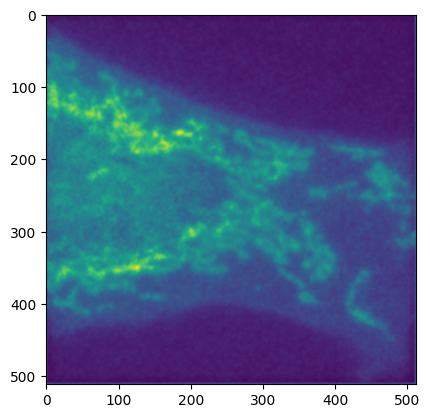

In [9]:
pred_comb = engine.predict(noisy_path)
pred_comb.shape

### Evaluate

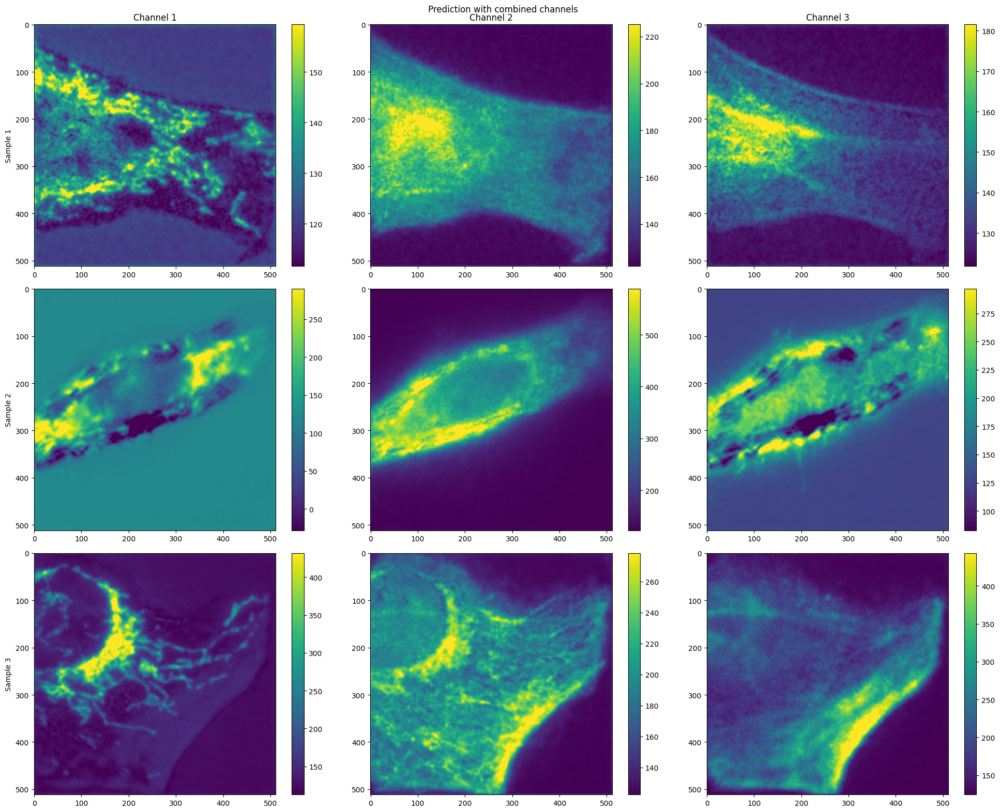

In [36]:
fig, axes = plt.subplots(samples, channels, figsize=(20, 16))
for i in range(samples):
    for j in range(channels):
        if i == 0:
            axes[j, 0].set_ylabel(f"Sample {j + 1}")
        if j == 0:
            axes[0, i].set_title(f"Channel {i + 1}")
        vmin = np.percentile(pred_comb[i, j], 1)
        vmax = np.percentile(pred_comb[i, j], 99)
        m = axes[i, j].imshow(pred_comb[i, j], vmin=vmin, vmax=vmax)
        plt.colorbar(m, ax=axes[i, j])
fig.suptitle("Prediction with combined channels")
plt.tight_layout()

## Channels Independent

### Configuration

### Train

### Predict

### Evaluate

In [2]:
os.getcwd()

'/home/melisande.croft/Documents/Repos/careamics/examples/2D/n2v'